In [178]:
import scanpy as sc
import pandas as pd
import scarches as sca
import matplotlib.pyplot as plt
import numpy as np
import scHPL

In [344]:
import louvain
import igraph
import re
import os
import sys
import json
import gc

In [43]:
import matplotlib
from matplotlib import pyplot as plt
sc.settings.set_figure_params(dpi=800, frameon=False)
sc.set_figure_params(dpi=800)
sc.set_figure_params(figsize=(4, 4))

matplotlib.rcParams['pdf.fonttype'] = 42

In [286]:
sc.settings.figdir="../result/8.29_scHPL/"

In [2]:
adata=sc.read(
    "../../important_processed_data/8.27_mergeall_log1p_gene_filtered.h5ad"
)

In [11]:
refdata=sc.read("../../important_processed_data/4.17_wt_integrate_SCRAN_log1p_scANVI.h5ad")

In [12]:
np.isin(adata.var_names, refdata.var.highly_variable)

array([False, False, False, False, False, False, False, ..., False, False,
       False, False, False, False, False])

In [3]:
refdata = refdata[:,refdata.var.highly_variable].copy()

In [17]:
sum(np.isin(adata.var_names, refdata.var_names[refdata.var.highly_variable]))

2000

In [20]:
adata=adata[:,np.isin(adata.var_names, refdata.var_names[refdata.var.highly_variable])].copy()

In [21]:
adata

AnnData object with n_obs × n_vars = 781397 × 2000
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log'
    var: 'features', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'hi

In [22]:
metadata=pd.read_csv("../../unimportant_processed_data/8.25_integrateAll/8.27_metadata.csv")

/tmp/ipykernel_4060131/1364570276.py:1: DtypeWarning: Columns (3,4,5,16,17,18,19,21,22,24,28,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata=pd.read_csv("../../unimportant_processed_data/8.25_integrateAll/8.27_metadata.csv")


In [25]:
metadata=metadata.set_index("Unnamed: 0")

In [35]:
adata.obs["Project"]=metadata.loc[adata.obs_names]["Project"]

In [37]:
adata.obs["batch"]=metadata.loc[adata.obs_names]["batch"]

In [38]:
adata.obs["batch"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1            Suture2021_Farmer_E17
                                                                ...              
TTTGTTGAGGTGATAT-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGAGTCTTCCC-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGGTCCACACG-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCACTACGA-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCCGGGACT-1_8                                LimbG610C_Gorrell_calvariaWT4
Name: batch, Length: 781397, dtype: object

In [18]:
adata.obs["Project"]=metadata["Project"]

In [19]:
adata.obs["batch"]=metadata["batch"]

In [26]:
adata

AnnData object with n_obs × n_vars = 781397 × 0
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch'
    var: 'features', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm

In [22]:
adata.obs["Project"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1    NaN
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1    NaN
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1    NaN
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1    NaN
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1    NaN
                                                   ... 
TTTGTTGAGGTGATAT-1_8                                NaN
TTTGTTGAGTCTTCCC-1_8                                NaN
TTTGTTGGTCCACACG-1_8                                NaN
TTTGTTGTCACTACGA-1_8                                NaN
TTTGTTGTCCGGGACT-1_8                                NaN
Name: Project, Length: 781397, dtype: object

In [39]:
adata.write_h5ad("../../important_processed_data/8.27_merge_var_78w.h5ad")

In [4]:
unlabeled = refdata.obs.index[[ coarse_label != "Osteoblasts" for coarse_label in refdata.obs.coarse_label]]
refdata.obs['scanvi_label'] = refdata.obs.coarse_label.tolist()
refdata.obs.loc[unlabeled,'scanvi_label'] = "unlabeled"

In [18]:
refdata=sc.read("../../important_processed_data/4.17_wt_integrate_SCRAN_log1p_scANVI.h5ad")
sc.pp.highly_variable_genes(refdata, batch_key="batch",min_mean=0.035, flavor="cell_ranger",n_top_genes=1500)
refdata = refdata[:,refdata.var.highly_variable].copy()


/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.app

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.app

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.app

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)


In [19]:
refdata.X = refdata.layers['counts']
refdata.raw = refdata
raw = refdata.raw.to_adata()
raw.X = refdata.layers['counts']
refdata.raw = raw

In [243]:
adata.obs["batch"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1            Suture2021_Farmer_E17
                                                                ...              
TTTGTTGAGGTGATAT-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGAGTCTTCCC-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGGTCCACACG-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCACTACGA-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCCGGGACT-1_8                                LimbG610C_Gorrell_calvariaWT4
Name: batch, Length: 781397, dtype: object

In [22]:
unlabeled = refdata.obs.index[[ coarse_label != "Osteoblasts" for coarse_label in refdata.obs.coarse_label]]
refdata.obs['scanvi_label'] = refdata.obs.coarse_label.tolist()
refdata.obs.loc[unlabeled,'scanvi_label'] = "unlabeled"


In [ ]:
adata

In [23]:
condition_key = 'batch'
cell_type_key = 'scanvi_label'
unlabeled_category = "unlabeled"
nlatent=15
sca.models.SCVI.setup_anndata(refdata, batch_key=condition_key, labels_key=cell_type_key)

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


In [24]:
vae = sca.models.SCVI(
    refdata,
    n_layers=2,
    n_latent=nlatent,
    encode_covariates=True,
    deeply_inject_covariates=False,
    use_layer_norm="both",
    use_batch_norm="none",
        )
        
vae.train(max_epochs=100)
scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category =unlabeled_category)
scanvae.train(max_epochs=50)
reference_latent = sc.AnnData(scanvae.get_latent_representation())
reference_latent.obs["cell_type"] = refdata.obs[cell_type_key].tolist()
reference_latent.obs["batch"] = refdata.obs[condition_key].tolist()
reference_latent.obs["Project"] = refdata.obs["Project"].tolist()
reference_latent.obs["coarse_label"] = refdata.obs["coarse_label"].tolist()


/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:88: UserWarning: CUDA initialization: Unexpected error from cudaGetDeviceCount(). Did you run some cuda functions before calling NumCudaDevices() that might have already set an error? Error 804: forward compatibility was attempted on non supported HW (Triggered internally at ../c10/cuda/CUDAFunctions.cpp:109.)
  return torch._C._cuda_getDeviceCount() > 0
/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarnin

Epoch 1/100:   0%|          | 0/100 [00:00<?, ?it/s]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 2/100:   1%|          | 1/100 [00:48<1:19:22, 48.11s/it, loss=885, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 3/100:   2%|▏         | 2/100 [01:35<1:17:31, 47.46s/it, loss=881, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 4/100:   3%|▎         | 3/100 [02:22<1:16:24, 47.26s/it, loss=858, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 5/100:   4%|▍         | 4/100 [03:10<1:16:03, 47.54s/it, loss=855, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 6/100:   5%|▌         | 5/100 [03:57<1:15:01, 47.39s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 7/100:   6%|▌         | 6/100 [04:44<1:14:06, 47.31s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 8/100:   7%|▋         | 7/100 [05:31<1:13:12, 47.23s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 9/100:   8%|▊         | 8/100 [06:19<1:12:43, 47.43s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 10/100:   9%|▉         | 9/100 [07:06<1:11:59, 47.47s/it, loss=838, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 11/100:  10%|█         | 10/100 [07:55<1:11:43, 47.81s/it, loss=857, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 12/100:  11%|█         | 11/100 [08:43<1:10:50, 47.76s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 13/100:  12%|█▏        | 12/100 [09:30<1:09:54, 47.67s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 14/100:  13%|█▎        | 13/100 [10:17<1:08:43, 47.39s/it, loss=857, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 15/100:  14%|█▍        | 14/100 [11:04<1:07:46, 47.28s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 16/100:  15%|█▌        | 15/100 [11:51<1:06:53, 47.21s/it, loss=854, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 17/100:  16%|█▌        | 16/100 [12:38<1:06:15, 47.33s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 18/100:  17%|█▋        | 17/100 [13:26<1:05:25, 47.30s/it, loss=858, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 19/100:  18%|█▊        | 18/100 [14:13<1:04:48, 47.42s/it, loss=834, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 20/100:  19%|█▉        | 19/100 [15:01<1:03:57, 47.38s/it, loss=858, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 21/100:  20%|██        | 20/100 [15:49<1:03:27, 47.59s/it, loss=858, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 22/100:  21%|██        | 21/100 [16:36<1:02:35, 47.54s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 23/100:  22%|██▏       | 22/100 [17:25<1:02:19, 47.94s/it, loss=832, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 24/100:  23%|██▎       | 23/100 [18:12<1:01:09, 47.66s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 25/100:  24%|██▍       | 24/100 [18:59<1:00:03, 47.42s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 26/100:  25%|██▌       | 25/100 [19:46<59:04, 47.26s/it, loss=848, v_num=1]  

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 27/100:  26%|██▌       | 26/100 [20:34<58:27, 47.40s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 28/100:  27%|██▋       | 27/100 [21:21<57:45, 47.48s/it, loss=849, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 29/100:  28%|██▊       | 28/100 [22:08<56:44, 47.28s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 30/100:  29%|██▉       | 29/100 [22:56<56:04, 47.39s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 31/100:  30%|███       | 30/100 [23:44<55:42, 47.75s/it, loss=831, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 32/100:  31%|███       | 31/100 [24:32<54:52, 47.71s/it, loss=854, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 33/100:  32%|███▏      | 32/100 [25:19<53:55, 47.58s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 34/100:  33%|███▎      | 33/100 [26:06<53:00, 47.47s/it, loss=849, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 35/100:  34%|███▍      | 34/100 [26:54<52:12, 47.46s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 36/100:  35%|███▌      | 35/100 [27:41<51:11, 47.25s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 37/100:  36%|███▌      | 36/100 [28:27<50:10, 47.04s/it, loss=839, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 38/100:  37%|███▋      | 37/100 [29:14<49:25, 47.07s/it, loss=839, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 39/100:  38%|███▊      | 38/100 [30:02<48:44, 47.16s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 40/100:  39%|███▉      | 39/100 [30:49<47:53, 47.11s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 41/100:  40%|████      | 40/100 [31:37<47:22, 47.37s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 42/100:  41%|████      | 41/100 [32:25<46:53, 47.68s/it, loss=835, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 43/100:  42%|████▏     | 42/100 [33:12<45:53, 47.47s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 44/100:  43%|████▎     | 43/100 [34:00<45:07, 47.49s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 45/100:  44%|████▍     | 44/100 [34:47<44:14, 47.41s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 46/100:  45%|████▌     | 45/100 [35:34<43:25, 47.37s/it, loss=834, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 47/100:  46%|████▌     | 46/100 [36:22<42:41, 47.44s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 48/100:  47%|████▋     | 47/100 [37:09<41:55, 47.47s/it, loss=854, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 49/100:  48%|████▊     | 48/100 [37:56<40:58, 47.29s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/100:  49%|████▉     | 49/100 [38:43<40:13, 47.32s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 51/100:  50%|█████     | 50/100 [39:31<39:28, 47.37s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 52/100:  51%|█████     | 51/100 [40:18<38:32, 47.19s/it, loss=849, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 53/100:  52%|█████▏    | 52/100 [41:05<37:42, 47.13s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 54/100:  53%|█████▎    | 53/100 [41:51<36:44, 46.91s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 55/100:  54%|█████▍    | 54/100 [42:38<36:04, 47.06s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 56/100:  55%|█████▌    | 55/100 [43:26<35:21, 47.15s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 57/100:  56%|█████▌    | 56/100 [44:13<34:29, 47.03s/it, loss=840, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 58/100:  57%|█████▋    | 57/100 [45:00<33:42, 47.04s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 59/100:  58%|█████▊    | 58/100 [45:47<32:56, 47.06s/it, loss=840, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 60/100:  59%|█████▉    | 59/100 [46:34<32:08, 47.03s/it, loss=857, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 61/100:  60%|██████    | 60/100 [47:22<31:34, 47.36s/it, loss=856, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 62/100:  61%|██████    | 61/100 [48:09<30:42, 47.24s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 63/100:  62%|██████▏   | 62/100 [48:56<29:53, 47.19s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 64/100:  63%|██████▎   | 63/100 [49:43<29:02, 47.10s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 65/100:  64%|██████▍   | 64/100 [50:30<28:16, 47.12s/it, loss=838, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 66/100:  65%|██████▌   | 65/100 [51:16<27:17, 46.78s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 67/100:  66%|██████▌   | 66/100 [52:02<26:26, 46.67s/it, loss=838, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 68/100:  67%|██████▋   | 67/100 [52:49<25:44, 46.81s/it, loss=839, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 69/100:  68%|██████▊   | 68/100 [53:36<24:57, 46.80s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 70/100:  69%|██████▉   | 69/100 [54:23<24:06, 46.66s/it, loss=848, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 71/100:  70%|███████   | 70/100 [55:10<23:22, 46.74s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 72/100:  71%|███████   | 71/100 [55:57<22:43, 47.02s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 73/100:  72%|███████▏  | 72/100 [56:44<21:55, 46.97s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 74/100:  73%|███████▎  | 73/100 [57:31<21:05, 46.88s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 75/100:  74%|███████▍  | 74/100 [58:18<20:19, 46.91s/it, loss=837, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 76/100:  75%|███████▌  | 75/100 [59:05<19:32, 46.90s/it, loss=832, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 77/100:  76%|███████▌  | 76/100 [59:51<18:45, 46.89s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 78/100:  77%|███████▋  | 77/100 [1:00:39<18:01, 47.04s/it, loss=862, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 79/100:  78%|███████▊  | 78/100 [1:01:26<17:15, 47.05s/it, loss=857, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 80/100:  79%|███████▉  | 79/100 [1:02:13<16:29, 47.11s/it, loss=854, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 81/100:  80%|████████  | 80/100 [1:03:00<15:41, 47.10s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 82/100:  81%|████████  | 81/100 [1:03:47<14:54, 47.07s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 83/100:  82%|████████▏ | 82/100 [1:04:34<14:04, 46.94s/it, loss=852, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 84/100:  83%|████████▎ | 83/100 [1:05:21<13:17, 46.92s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 85/100:  84%|████████▍ | 84/100 [1:06:07<12:29, 46.86s/it, loss=860, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 86/100:  85%|████████▌ | 85/100 [1:06:54<11:41, 46.78s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 87/100:  86%|████████▌ | 86/100 [1:07:43<11:02, 47.32s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 88/100:  87%|████████▋ | 87/100 [1:08:30<10:14, 47.26s/it, loss=849, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 89/100:  88%|████████▊ | 88/100 [1:09:16<09:25, 47.10s/it, loss=856, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 90/100:  89%|████████▉ | 89/100 [1:10:04<08:38, 47.16s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 91/100:  90%|█████████ | 90/100 [1:10:51<07:50, 47.08s/it, loss=836, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 92/100:  91%|█████████ | 91/100 [1:11:38<07:04, 47.19s/it, loss=856, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 93/100:  92%|█████████▏| 92/100 [1:12:25<06:17, 47.14s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 94/100:  93%|█████████▎| 93/100 [1:13:13<05:30, 47.24s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 95/100:  94%|█████████▍| 94/100 [1:14:00<04:43, 47.27s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 96/100:  95%|█████████▌| 95/100 [1:14:47<03:55, 47.18s/it, loss=854, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 97/100:  96%|█████████▌| 96/100 [1:15:33<03:07, 46.91s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 98/100:  97%|█████████▋| 97/100 [1:16:19<02:20, 46.72s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 99/100:  98%|█████████▊| 98/100 [1:17:06<01:33, 46.59s/it, loss=860, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 100/100:  99%|█████████▉| 99/100 [1:17:53<00:46, 46.67s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 100/100: 100%|██████████| 100/100 [1:18:40<00:00, 46.75s/it, loss=847, v_num=1]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [1:18:40<00:00, 47.20s/it, loss=847, v_num=1]


/home/gilberthan/.local/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(


INFO     Training for 50 epochs.                                                                                   


/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 2/50:   2%|▏         | 1/50 [01:07<55:14, 67.64s/it, loss=856, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 3/50:   4%|▍         | 2/50 [02:16<54:43, 68.42s/it, loss=849, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 4/50:   6%|▌         | 3/50 [03:24<53:31, 68.34s/it, loss=856, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 5/50:   8%|▊         | 4/50 [04:32<52:14, 68.13s/it, loss=839, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 6/50:  10%|█         | 5/50 [05:42<51:35, 68.78s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 7/50:  12%|█▏        | 6/50 [06:52<50:37, 69.04s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 8/50:  14%|█▍        | 7/50 [07:59<49:08, 68.56s/it, loss=839, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 9/50:  16%|█▌        | 8/50 [09:08<47:57, 68.50s/it, loss=859, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 10/50:  18%|█▊        | 9/50 [10:17<46:55, 68.67s/it, loss=840, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 11/50:  20%|██        | 10/50 [11:27<46:06, 69.17s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 12/50:  22%|██▏       | 11/50 [12:36<44:56, 69.13s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 13/50:  24%|██▍       | 12/50 [13:47<44:03, 69.56s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 14/50:  26%|██▌       | 13/50 [14:55<42:41, 69.23s/it, loss=851, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 15/50:  28%|██▊       | 14/50 [16:04<41:25, 69.05s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 16/50:  30%|███       | 15/50 [17:12<40:11, 68.90s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 17/50:  32%|███▏      | 16/50 [18:20<38:53, 68.64s/it, loss=837, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 18/50:  34%|███▍      | 17/50 [19:29<37:43, 68.58s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 19/50:  36%|███▌      | 18/50 [20:37<36:36, 68.64s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 20/50:  38%|███▊      | 19/50 [21:45<35:20, 68.40s/it, loss=837, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 21/50:  40%|████      | 20/50 [22:54<34:11, 68.39s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 22/50:  42%|████▏     | 21/50 [24:02<33:02, 68.36s/it, loss=838, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 23/50:  44%|████▍     | 22/50 [25:09<31:47, 68.11s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 24/50:  46%|████▌     | 23/50 [26:17<30:37, 68.05s/it, loss=831, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 25/50:  48%|████▊     | 24/50 [27:27<29:39, 68.43s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 26/50:  50%|█████     | 25/50 [28:37<28:45, 69.01s/it, loss=837, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 27/50:  52%|█████▏    | 26/50 [29:46<27:33, 68.91s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 28/50:  54%|█████▍    | 27/50 [30:54<26:20, 68.71s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 29/50:  56%|█████▌    | 28/50 [32:02<25:07, 68.54s/it, loss=860, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 30/50:  58%|█████▊    | 29/50 [33:11<24:00, 68.62s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 31/50:  60%|██████    | 30/50 [34:19<22:51, 68.58s/it, loss=841, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 32/50:  62%|██████▏   | 31/50 [35:29<21:49, 68.92s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 33/50:  64%|██████▍   | 32/50 [36:39<20:46, 69.27s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 34/50:  66%|██████▌   | 33/50 [37:48<19:35, 69.13s/it, loss=846, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 35/50:  68%|██████▊   | 34/50 [38:57<18:25, 69.10s/it, loss=835, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 36/50:  70%|███████   | 35/50 [40:05<17:12, 68.81s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 37/50:  72%|███████▏  | 36/50 [41:14<16:02, 68.75s/it, loss=845, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 38/50:  74%|███████▍  | 37/50 [42:24<15:00, 69.24s/it, loss=836, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 39/50:  76%|███████▌  | 38/50 [43:32<13:46, 68.86s/it, loss=853, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 40/50:  78%|███████▊  | 39/50 [44:40<12:33, 68.47s/it, loss=833, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 41/50:  80%|████████  | 40/50 [45:48<11:24, 68.41s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 42/50:  82%|████████▏ | 41/50 [46:55<10:12, 68.09s/it, loss=850, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 43/50:  84%|████████▍ | 42/50 [48:03<09:04, 68.06s/it, loss=847, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 44/50:  86%|████████▌ | 43/50 [49:12<07:57, 68.24s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 45/50:  88%|████████▊ | 44/50 [50:20<06:49, 68.20s/it, loss=843, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 46/50:  90%|█████████ | 45/50 [51:29<05:41, 68.28s/it, loss=838, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 47/50:  92%|█████████▏| 46/50 [52:37<04:33, 68.40s/it, loss=844, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 48/50:  94%|█████████▍| 47/50 [53:47<03:26, 68.79s/it, loss=835, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 49/50:  96%|█████████▌| 48/50 [54:55<02:17, 68.51s/it, loss=842, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/50:  98%|█████████▊| 49/50 [56:02<01:08, 68.27s/it, loss=837, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/50: 100%|██████████| 50/50 [57:10<00:00, 68.16s/it, loss=846, v_num=1]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [57:10<00:00, 68.62s/it, loss=846, v_num=1]


In [25]:
ref_path_scanvi = '../model/scanvi_model/'
scanvae.save(ref_path_scanvi, overwrite=True)
ref_path_vae = '../model/vae_model/'
scanvae.save(ref_path_vae, overwrite=True)

In [ ]:
tree_ref, mp_ref = sca.classifiers.scHPL.learn_tree(data = reference_latent,
                batch_key = 'batch',
                cell_type_key='celltype_batch',
                classifier = 'knn', dynamic_neighbors=True,
                dimred = False, print_conf= False)

In [ ]:
sc.pp.neighbors(reference_latent, n_neighbors=8)
sc.tl.leiden(reference_latent)
sc.tl.umap(reference_latent)
sc.pl.umap(reference_latent,
    color=['batch', 'coarse_label'],
    frameon=False,
    wspace=0.6
    )

In [27]:
adata2=sc.read("../../important_processed_data/5.22_integrate_adata.h5ad")

In [33]:
reference_latent.obs.index=refdata.obs.index

In [34]:
adata2.obs.index

Index(['Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0',
       'Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0',
       'Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0',
       'Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0',
       'Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0',
       'Suture2021_Farmer_E17_AAAGATGAGGGAACGG-1_1-0',
       'Suture2021_Farmer_E17_AAAGTAGAGGAATGGA-1_1-0',
       'Suture2021_Farmer_E17_AAAGTAGCAGCTATTG-1_1-0',
       'Suture2021_Farmer_E17_AAAGTAGTCAATCACG-1_1-0',
       'Suture2021_Farmer_E17_AAAGTAGTCGGAGCAA-1_1-0',
       ...
       'TTTCAGTAGAAGTCCG-1_5-1-2', 'TTTCAGTAGGTAGTCG-1_5-1-2',
       'TTTCCTCGTTGTGGCC-1_5-1-2', 'TTTCGATTCCTCTAAT-1_5-1-2',
       'TTTCGATTCTGGTGCG-1_5-1-2', 'TTTGACTGTATTTCCT-1_5-1-2',
       'TTTGACTGTTGCATTG-1_5-1-2', 'TTTGACTTCTTGGGCG-1_5-1-2',
       'TTTGGAGCAGCGACAA-1_5-1-2', 'TTTGGTTCACTACTTT-1_5-1-2'],
      dtype='object', name='Unnamed: 0', length=272369)

In [36]:
filter_boolean = refdata.obs.index.isin(adata2.obs.index)


In [37]:
reflatent2 = reference_latent[filter_boolean, :].copy()

In [41]:
reflatent2.obs=adata2.obs

In [47]:
test=reflatent2.obs.groupby(['C7_named', 'C19_named', 'C36_named', 'C49_named', 'C90_named',"C137_named"]).count()


KeyboardInterrupt



In [72]:
testadata=reflatent2[1:1000,:]

In [79]:
test=testadata.obs.groupby(['C7_named', 'C19_named', 'C36_named', 'C49_named', 'C90_named',"C137_named"]).count()['Sample']

In [104]:
test=testadata.obs.groupby(['C7_named', 'C19_named']).count()

In [ ]:
test

In [94]:
test
test = test.iloc[test.values>0]
test.index[0]

('Chondro', 'HC')

In [95]:
test

C7_named    C19_named 
Chondro     HC              3
Fibroblast  Fibro           5
Lepr+ BMSC  Lepr+ BMSC      4
Ly6a+ MSC   Ly6a+ MSC     215
MSC         Early.MSC      24
            Late.MSC      301
            Meninges       80
            Middle.MSC     11
            Pre-ob        301
Ob          Ob             55
Name: Sample, dtype: int64

In [123]:
test=testadata.obs.groupby(['C7_named', 'C19_named']).size()

In [125]:
test = testadata.obs.groupby(['C7_named', 'C19_named']).filter(lambda x: len(x) > 0).groupby(['C7_named', 'C19_named']).size()

In [129]:
import dask.dataframe as dd


In [146]:
df = dd.from_pandas(testadata.obs,chunksize=100000)


In [166]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    test=df.groupby(['C7_named', 'C19_named'],observed=True).size().compute()


[########################################] | 100% Completed | 102.47 ms


In [167]:
test

C7_named    C19_named      
Chondro     Mature Chondro     19207
            HC                  4776
            CPC                26294
            Hmmr+ CPC           7692
            Tex14+ HC             32
Ob          Ob                 18825
Pericyte    Pericyte            2462
            Col1a1.Chondro       258
MSC         Pre-ob             22334
            Early.MSC          42145
            Irx1+ MSC           8874
            Late.MSC           21301
            Middle.MSC         26147
            Meninges            1387
Ly6a+ MSC   Ly6a+ MSC           9206
Lepr+ BMSC  Lepr+ BMSC         49756
Fibroblast  Fibro              11423
Chondro     Cyp26a1.Chondro      250
dtype: int64

In [175]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    test2=df.groupby(['C7_named', 'C19_named',"C36_named"],observed=True).size().compute()


[########################################] | 100% Completed | 102.57 ms


In [173]:
test2 = test2.iloc[test2.values>0]

In [140]:
computed_result = test.compute()

In [168]:
df= dd.from_pandas(reflatent2.obs,npartitions=4)

In [169]:
with ProgressBar():
    xx = df.groupby(['C7_named', 'C19_named', 'C36_named', 'C49_named', 'C90_named',"C137_named"],observed=True).size().compute()
xx = xx.iloc[xx.values>0]
xx.index[0]

[########################################] | 100% Completed | 102.55 ms


('Chondro',
 'Mature Chondro',
 'Il17b.Mature Chondro',
 'Il17b.Mature Chondro',
 'C1qtnf3.Il17b.Mature Chondro',
 'Serpina1a.C1qtnf3.Il17b.Mature Chondro')

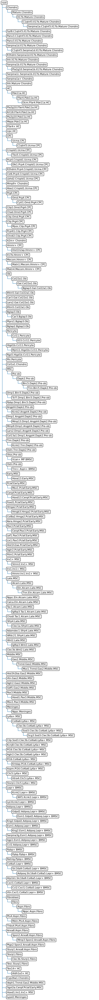

In [199]:
osteo_tree = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None
parent3 = None
parent4 = None

for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                parent3 = newNode
            elif i == 3:
                parent3.add_descendant(newNode)
                parent4 = newNode
            elif i == 4:
                parent4.add_descendant(newNode)
            elif i == 5:
                parent5.add_descendant(newNode)
                
            i+=1
                
scHPL.utils.print_tree(osteo_tree)

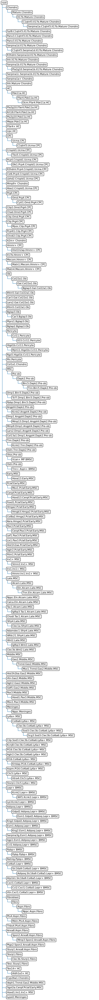

In [308]:
osteo_tree_test = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None
parent3 = None
parent4 = None
parent5 = None

for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree_test[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                parent3 = newNode
            elif i == 3:
                parent3.add_descendant(newNode)
                parent4 = newNode
            elif i == 4:
                parent4.add_descendant(newNode)
                parent5=newNode
            elif i == 5:
                parent5.add_descendant(newNode)
                
            i+=1
                
scHPL.utils.print_tree(osteo_tree_test)

In [307]:
parent5

Node("['Scg3.Sod3.Clec3b.Col6a6.Ly6a+ MSC']")

In [193]:
scHPL.utils.TreeNode([ind_sub])

Node("['C1qtnf3.Il17b.Mature Chondro']")

In [200]:
LCA=sc.read("../data/HLCA_emb_and_metadata.h5ad")

In [202]:
LCA.obs["ann_finest_level"]

GCGACCATCCCTAACC_SC22      Alveolar macrophages
P2_1_GCGCAACCAGTTAACC                  NK cells
GCTCTGTAGTGCTGCC_SC27                       AT2
P2_8_TTAGGACGTTCAGGCC         Alveolar Mφ CCL3+
CTTGATTGTCAGTTTG_T164                Suprabasal
                                   ...         
ACCTTTACATTAACCG_T120                Suprabasal
CATTATCTCCATGAAC_F01639                     DC2
AGGCCGTGTGTGACCC-SC56                       AT2
CGATGGCAGCAGGCTA-1-2               Club (nasal)
AATCGGTGTCGGCACT-1-4               Club (nasal)
Name: ann_finest_level, Length: 584884, dtype: category
Categories (58, object): ['AT1', 'AT2', 'AT2 proliferating', 'Adventitial fibroblasts', ..., 'Suprabasal', 'T cells proliferating', 'Transitional Club-AT2', 'Tuft']

In [206]:
LCA.obs["ann_level_5"]

GCGACCATCCCTAACC_SC22                   None
P2_1_GCGCAACCAGTTAACC                   None
GCTCTGTAGTGCTGCC_SC27                   None
P2_8_TTAGGACGTTCAGGCC      Alveolar Mφ CCL3+
CTTGATTGTCAGTTTG_T164                   None
                                 ...        
ACCTTTACATTAACCG_T120                   None
CATTATCTCCATGAAC_F01639                 None
AGGCCGTGTGTGACCC-SC56                   None
CGATGGCAGCAGGCTA-1-2            Club (nasal)
AATCGGTGTCGGCACT-1-4            Club (nasal)
Name: ann_level_5, Length: 584884, dtype: category
Categories (15, object): ['Alveolar Mφ CCL3+', 'Alveolar Mφ MT-positive', 'Alveolar Mφ proliferating', 'Club (nasal)', ..., 'Multiciliated (non-nasal)', 'None', 'SMG serous (bronchial)', 'SMG serous (nasal)']

In [207]:
osteo_tree = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C137_named.values), 
               osteo_tree, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)


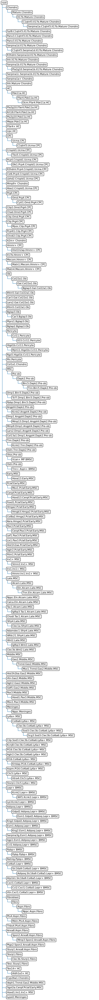

In [209]:
scHPL.utils.print_tree(osteo_tree)

In [210]:
import pickle
 
file_to_store = open("../model/tree_osteo.pickle", "wb")
pickle.dump(osteo_tree, file_to_store)
file_to_store.close()

In [223]:
adata=sc.read(
    "../../important_processed_data/8.27_mergeall_log1p_gene_filtered.h5ad"
)  

In [213]:
adata2

AnnData object with n_obs × n_vars = 272369 × 62934
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Sample', 'Project', 'Limb.Atlas', 'Organ', 'Tissue', 'Tissue.Specific.', 'Stage', 'Gene.type', 'Treatment', 'Age', 'Age.In.Detail.', 'Machine', 'Species', 'Isolation.approach', 'Digestion', 'Enzymes', 'Bone.Forming.Methods', 'Data.Source', 'Related.Assay', 'Origin', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'temp_cluster', 'batch', 'batch_atlas', 'size_factors', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'anno_level_1', 'anno_level_2', 'anno_level_3', 'anno_level_4', 'anno_level_5', 'mix_level_1', 'mix_level_2', 'merge_id_level3', 'merge_id_level4', 'merge_id_level5', 'cellid', 'leiden_clusters_level_1', 'leiden_clusters_level_2', 'le

In [ ]:
adata=adata[:,np.isin(adata.var_names, refdata.var_names)].copy()

In [224]:
sum(np.isin(adata.var_names, refdata.var_names))

1500

In [219]:
refdata.var_names

Index(['1190002N15Rik', '1500009L16Rik', '1500015O10Rik', '1810011O10Rik',
       '1810041L15Rik', '2700069I18Rik', '2810417H13Rik', '2810474O19Rik',
       '3110079O15Rik', '3830403N18Rik',
       ...
       'Zbtb20', 'Zcchc5', 'Zdbf2', 'Zeb2', 'Zfhx3', 'Zfhx4', 'Zfp36',
       'Zfp36l2', 'Zfp503', 'a'],
      dtype='object', length=1500)

In [217]:
sum(adata2.var.highly_variable)

2000

In [234]:
adata

AnnData object with n_obs × n_vars = 781397 × 1500
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log'
    var: 'features', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'hi

In [231]:
adata.X = adata.layers['counts']
adata.raw = adata
raw = adata.raw.to_adata()
raw.X = adata.layers['counts']
adata.raw = raw

In [232]:
adata.n_obs

781397

In [ ]:
adata

In [235]:
metadata=pd.read_csv("../../unimportant_processed_data/8.25_integrateAll/8.27_metadata.csv")

/tmp/ipykernel_4072091/1364570276.py:1: DtypeWarning: Columns (3,4,5,16,17,18,19,21,22,24,28,29,30,31) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata=pd.read_csv("../../unimportant_processed_data/8.25_integrateAll/8.27_metadata.csv")


In [236]:
metadata=metadata.set_index("Unnamed: 0")

In [237]:
adata.obs["Project"]=metadata.loc[adata.obs_names]["Project"]

In [238]:
adata.obs["batch"]=metadata.loc[adata.obs_names]["batch"]

In [239]:
adata.obs["batch"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1            Suture2021_Farmer_E17
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1            Suture2021_Farmer_E17
                                                                ...              
TTTGTTGAGGTGATAT-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGAGTCTTCCC-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGGTCCACACG-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCACTACGA-1_8                                LimbG610C_Gorrell_calvariaWT4
TTTGTTGTCCGGGACT-1_8                                LimbG610C_Gorrell_calvariaWT4
Name: batch, Length: 781397, dtype: object

In [246]:
adata.obs["batch"]=adata.obs["batch"].apply(str) 
model = sca.models.SCANVI.load_query_data(
    adata,
    ref_path_scanvi,
    freeze_dropout = True,
)
model._unlabeled_indices = np.arange(adata.n_obs)
model._labeled_indices = []
print("Labelled Indices: ", len(model._labeled_indices))
print("Unlabelled Indices: ", len(model._unlabeled_indices))

INFO     File ../model/scanvi_model/model.pt already downloaded                                                    


/home/gilberthan/.local/lib/python3.10/site-packages/scvi/data/fields/_layer_field.py:91: UserWarning: adata.X does not contain unnormalized count data. Are you sure this is what you want?
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/data/fields/_scanvi.py:91: UserWarning: Missing labels key scanvi_label. Filling in with unlabeled category unlabeled.
  warnings.warn(


Labelled Indices:  0
Unlabelled Indices:  781397


In [247]:
model.train(
    max_epochs=100,
    plan_kwargs=dict(weight_decay=0.0),
    check_val_every_n_epoch=10,
)

INFO     Training for 100 epochs.                                                                                  


/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
/home/gilberthan/.local/lib/python3.10/site-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


Epoch 1/100:   0%|          | 0/100 [00:00<?, ?it/s]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 2/100:   1%|          | 1/100 [02:14<3:42:01, 134.56s/it, loss=933, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 3/100:   2%|▏         | 2/100 [04:29<3:40:04, 134.74s/it, loss=932, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 4/100:   3%|▎         | 3/100 [06:42<3:36:49, 134.12s/it, loss=904, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 5/100:   4%|▍         | 4/100 [08:59<3:35:58, 134.98s/it, loss=929, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 6/100:   5%|▌         | 5/100 [11:16<3:34:59, 135.79s/it, loss=912, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 7/100:   6%|▌         | 6/100 [13:32<3:32:55, 135.91s/it, loss=909, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 8/100:   7%|▋         | 7/100 [15:47<3:30:19, 135.69s/it, loss=910, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 9/100:   8%|▊         | 8/100 [18:04<3:28:48, 136.18s/it, loss=926, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 10/100:   9%|▉         | 9/100 [20:20<3:26:15, 136.00s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 11/100:  10%|█         | 10/100 [22:44<3:27:49, 138.55s/it, loss=906, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 12/100:  11%|█         | 11/100 [25:01<3:24:46, 138.05s/it, loss=931, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 13/100:  12%|█▏        | 12/100 [27:16<3:20:52, 136.96s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 14/100:  13%|█▎        | 13/100 [29:32<3:18:19, 136.78s/it, loss=902, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 15/100:  14%|█▍        | 14/100 [31:46<3:14:56, 136.00s/it, loss=912, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 16/100:  15%|█▌        | 15/100 [34:00<3:11:48, 135.39s/it, loss=916, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 17/100:  16%|█▌        | 16/100 [36:16<3:09:41, 135.49s/it, loss=917, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 18/100:  17%|█▋        | 17/100 [38:30<3:07:00, 135.19s/it, loss=935, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 19/100:  18%|█▊        | 18/100 [40:43<3:03:43, 134.43s/it, loss=914, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 20/100:  19%|█▉        | 19/100 [42:56<3:00:59, 134.07s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 21/100:  20%|██        | 20/100 [45:21<3:02:48, 137.11s/it, loss=936, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 22/100:  21%|██        | 21/100 [47:36<2:59:48, 136.56s/it, loss=929, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 23/100:  22%|██▏       | 22/100 [49:49<2:56:24, 135.69s/it, loss=913, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 24/100:  23%|██▎       | 23/100 [52:06<2:54:18, 135.83s/it, loss=921, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 25/100:  24%|██▍       | 24/100 [54:20<2:51:29, 135.39s/it, loss=942, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 26/100:  25%|██▌       | 25/100 [56:35<2:48:58, 135.18s/it, loss=913, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 27/100:  26%|██▌       | 26/100 [58:45<2:45:06, 133.87s/it, loss=926, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 28/100:  27%|██▋       | 27/100 [1:00:57<2:42:10, 133.29s/it, loss=917, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 29/100:  28%|██▊       | 28/100 [1:03:10<2:39:38, 133.03s/it, loss=910, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 30/100:  29%|██▉       | 29/100 [1:05:20<2:36:23, 132.16s/it, loss=930, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 31/100:  30%|███       | 30/100 [1:07:42<2:37:28, 134.98s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 32/100:  31%|███       | 31/100 [1:09:55<2:34:45, 134.57s/it, loss=923, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 33/100:  32%|███▏      | 32/100 [1:12:06<2:31:19, 133.52s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 34/100:  33%|███▎      | 33/100 [1:14:20<2:29:15, 133.66s/it, loss=900, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 35/100:  34%|███▍      | 34/100 [1:16:34<2:27:02, 133.68s/it, loss=908, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 36/100:  35%|███▌      | 35/100 [1:18:46<2:24:13, 133.13s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 37/100:  36%|███▌      | 36/100 [1:20:59<2:22:04, 133.19s/it, loss=916, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 38/100:  37%|███▋      | 37/100 [1:23:11<2:19:35, 132.95s/it, loss=909, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 39/100:  38%|███▊      | 38/100 [1:25:23<2:16:58, 132.55s/it, loss=935, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 40/100:  39%|███▉      | 39/100 [1:27:35<2:14:33, 132.35s/it, loss=921, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 41/100:  40%|████      | 40/100 [1:29:58<2:15:35, 135.60s/it, loss=910, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 42/100:  41%|████      | 41/100 [1:32:09<2:11:56, 134.18s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 43/100:  42%|████▏     | 42/100 [1:34:22<2:09:28, 133.94s/it, loss=912, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 44/100:  43%|████▎     | 43/100 [1:36:34<2:06:42, 133.37s/it, loss=915, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 45/100:  44%|████▍     | 44/100 [1:38:46<2:03:55, 132.78s/it, loss=920, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 46/100:  45%|████▌     | 45/100 [1:40:58<2:01:39, 132.71s/it, loss=926, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 47/100:  46%|████▌     | 46/100 [1:43:11<1:59:18, 132.57s/it, loss=928, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 48/100:  47%|████▋     | 47/100 [1:45:23<1:57:04, 132.55s/it, loss=913, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 49/100:  48%|████▊     | 48/100 [1:47:36<1:55:01, 132.73s/it, loss=918, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 50/100:  49%|████▉     | 49/100 [1:49:50<1:52:57, 132.90s/it, loss=923, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 51/100:  50%|█████     | 50/100 [1:52:12<1:52:59, 135.60s/it, loss=928, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 52/100:  51%|█████     | 51/100 [1:54:24<1:49:58, 134.66s/it, loss=937, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 53/100:  52%|█████▏    | 52/100 [1:56:37<1:47:19, 134.17s/it, loss=910, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 54/100:  53%|█████▎    | 53/100 [1:58:51<1:45:09, 134.24s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 55/100:  54%|█████▍    | 54/100 [2:01:06<1:42:57, 134.30s/it, loss=901, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 56/100:  55%|█████▌    | 55/100 [2:03:24<1:41:32, 135.38s/it, loss=935, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 57/100:  56%|█████▌    | 56/100 [2:05:36<1:38:40, 134.57s/it, loss=917, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 58/100:  57%|█████▋    | 57/100 [2:07:50<1:36:09, 134.17s/it, loss=922, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 59/100:  58%|█████▊    | 58/100 [2:10:06<1:34:21, 134.81s/it, loss=932, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 60/100:  59%|█████▉    | 59/100 [2:12:19<1:31:47, 134.33s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 61/100:  60%|██████    | 60/100 [2:14:42<1:31:20, 137.02s/it, loss=924, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 62/100:  61%|██████    | 61/100 [2:16:56<1:28:21, 135.92s/it, loss=935, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 63/100:  62%|██████▏   | 62/100 [2:19:09<1:25:28, 134.97s/it, loss=917, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 64/100:  63%|██████▎   | 63/100 [2:21:25<1:23:27, 135.33s/it, loss=926, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 65/100:  64%|██████▍   | 64/100 [2:23:38<1:20:53, 134.81s/it, loss=923, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 66/100:  65%|██████▌   | 65/100 [2:25:53<1:18:33, 134.67s/it, loss=933, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 67/100:  66%|██████▌   | 66/100 [2:28:06<1:16:00, 134.13s/it, loss=929, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 68/100:  67%|██████▋   | 67/100 [2:30:19<1:13:43, 134.03s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 69/100:  68%|██████▊   | 68/100 [2:32:31<1:11:09, 133.42s/it, loss=923, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 70/100:  69%|██████▉   | 69/100 [2:34:44<1:08:44, 133.06s/it, loss=924, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 71/100:  70%|███████   | 70/100 [2:37:10<1:08:28, 136.96s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 72/100:  71%|███████   | 71/100 [2:39:23<1:05:37, 135.77s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 73/100:  72%|███████▏  | 72/100 [2:41:37<1:03:07, 135.26s/it, loss=930, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 74/100:  73%|███████▎  | 73/100 [2:43:50<1:00:33, 134.59s/it, loss=921, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 75/100:  74%|███████▍  | 74/100 [2:46:04<58:14, 134.41s/it, loss=923, v_num=1]  

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 76/100:  75%|███████▌  | 75/100 [2:48:19<56:06, 134.68s/it, loss=941, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 77/100:  76%|███████▌  | 76/100 [2:50:35<54:03, 135.16s/it, loss=928, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 78/100:  77%|███████▋  | 77/100 [2:52:51<51:55, 135.44s/it, loss=926, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 79/100:  78%|███████▊  | 78/100 [2:55:08<49:45, 135.69s/it, loss=941, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 80/100:  79%|███████▉  | 79/100 [2:57:22<47:17, 135.14s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 81/100:  80%|████████  | 80/100 [2:59:44<45:47, 137.35s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 82/100:  81%|████████  | 81/100 [3:02:00<43:23, 137.01s/it, loss=943, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 83/100:  82%|████████▏ | 82/100 [3:04:16<40:58, 136.56s/it, loss=924, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 84/100:  83%|████████▎ | 83/100 [3:06:29<38:26, 135.69s/it, loss=929, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 85/100:  84%|████████▍ | 84/100 [3:08:43<36:02, 135.17s/it, loss=939, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 86/100:  85%|████████▌ | 85/100 [3:10:58<33:43, 134.87s/it, loss=910, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 87/100:  86%|████████▌ | 86/100 [3:13:12<31:26, 134.74s/it, loss=930, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 88/100:  87%|████████▋ | 87/100 [3:15:26<29:07, 134.45s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 89/100:  88%|████████▊ | 88/100 [3:17:37<26:40, 133.36s/it, loss=927, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 90/100:  89%|████████▉ | 89/100 [3:19:48<24:21, 132.85s/it, loss=919, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 91/100:  90%|█████████ | 90/100 [3:22:11<22:37, 135.76s/it, loss=928, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 92/100:  91%|█████████ | 91/100 [3:24:24<20:15, 135.06s/it, loss=932, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 93/100:  92%|█████████▏| 92/100 [3:26:36<17:53, 134.18s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 94/100:  93%|█████████▎| 93/100 [3:28:50<15:38, 134.04s/it, loss=934, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 95/100:  94%|█████████▍| 94/100 [3:31:04<13:24, 134.06s/it, loss=932, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 96/100:  95%|█████████▌| 95/100 [3:33:18<11:09, 133.92s/it, loss=920, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 97/100:  96%|█████████▌| 96/100 [3:35:31<08:55, 133.83s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 98/100:  97%|█████████▋| 97/100 [3:37:44<06:40, 133.37s/it, loss=914, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 99/100:  98%|█████████▊| 98/100 [3:39:57<04:27, 133.51s/it, loss=925, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 100/100:  99%|█████████▉| 99/100 [3:42:14<02:14, 134.48s/it, loss=931, v_num=1]

/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(
/home/gilberthan/.local/lib/python3.10/site-packages/scvi/distributions/_negative_binomial.py:482: UserWarning: The value argument must be within the support of the distribution
  warnings.warn(


Epoch 100/100: 100%|██████████| 100/100 [3:44:37<00:00, 137.06s/it, loss=918, v_num=1]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|██████████| 100/100 [3:44:37<00:00, 134.78s/it, loss=918, v_num=1]


In [248]:
query_latent = sc.AnnData(model.get_latent_representation())

In [250]:
query_latent.obs=adata.obs

In [251]:
sc.pp.neighbors(query_latent)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent)

2023-08-29 18:05:18.127728: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [254]:
query_latent

AnnData object with n_obs × n_vars = 781397 × 15
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', '_scvi_batch', 'scanvi_label', '_scvi_labels', 'leiden'
    uns: 'neighbors', 'leiden', 'umap'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


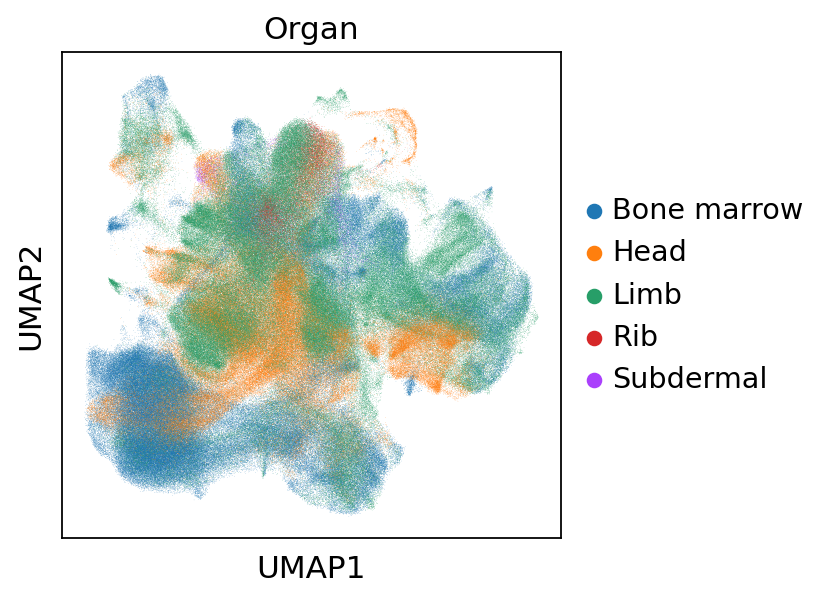

In [255]:
sc.pl.umap(query_latent,color=["Organ"])

In [257]:
query_latent.write_h5ad("../../important_processed_data/8.29_reflatent.h5ad")

In [259]:
adata.obsm["X_scANVI"]=query_latent.X

In [260]:
adata.obsm["X_umap"]=query_latent.obsm["X_umap"]

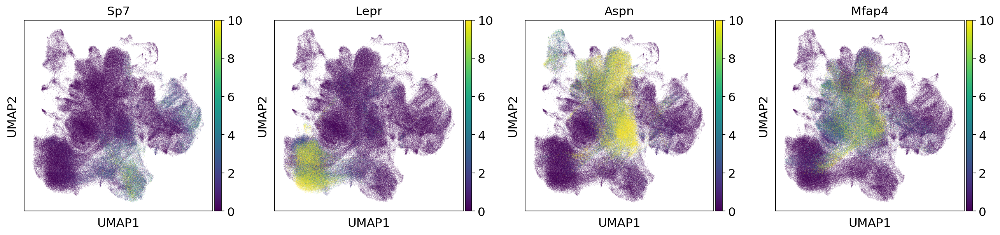

In [262]:
sc.pl.umap(adata,color=["Sp7","Lepr","Aspn","Mfap4"],vmax=10)

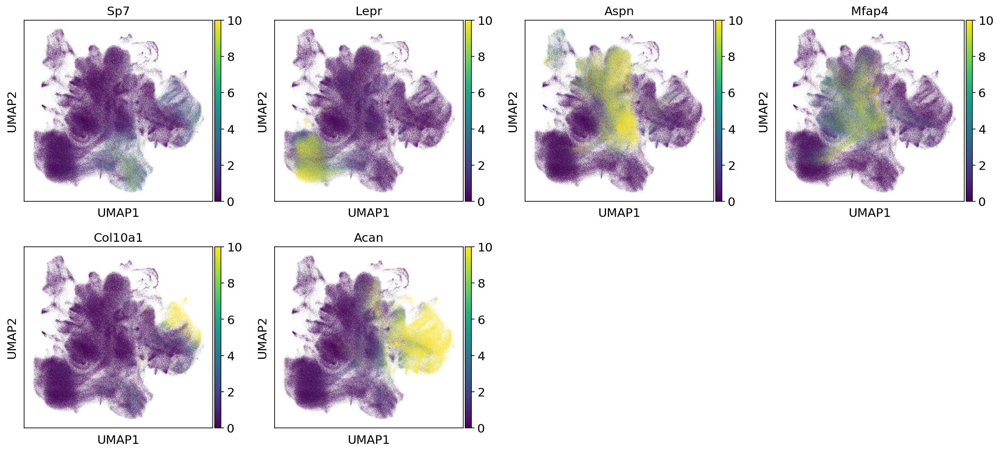

In [263]:
sc.pl.umap(adata,color=["Sp7","Lepr","Aspn","Mfap4","Col10a1","Acan"],vmax=10)

In [264]:
y_pred = scHPL.predict.predict_labels(reflatent2.X,
               tree = osteo_tree,
               threshold = 0.5)

In [268]:
reflatent2

AnnData object with n_obs × n_vars = 272369 × 15
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Sample', 'Project', 'Limb.Atlas', 'Organ', 'Tissue', 'Tissue.Specific.', 'Stage', 'Gene.type', 'Treatment', 'Age', 'Age.In.Detail.', 'Machine', 'Species', 'Isolation.approach', 'Digestion', 'Enzymes', 'Bone.Forming.Methods', 'Data.Source', 'Related.Assay', 'Origin', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'temp_cluster', 'batch', 'batch_atlas', 'size_factors', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'anno_level_1', 'anno_level_2', 'anno_level_3', 'anno_level_4', 'anno_level_5', 'mix_level_1', 'mix_level_2', 'merge_id_level3', 'merge_id_level4', 'merge_id_level5', 'cellid', 'leiden_clusters_level_1', 'leiden_clusters_level_2', 'leide

In [265]:
reflatent2.obs["predLabel"]=y_pred

In [270]:
adata2.obs["predLabel"]=y_pred

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


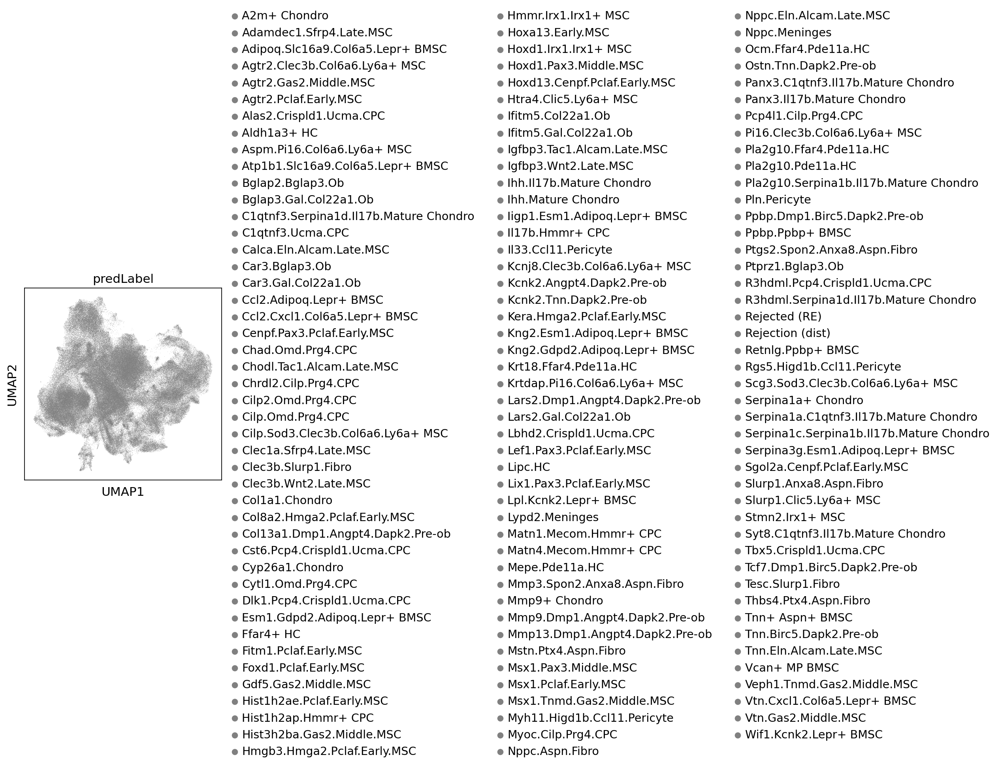

In [272]:
sc.pl.umap(adata2,color="predLabel")

In [274]:
idx_rej = ((y_pred== 'Rejection (dist)') | (y_pred == 'Rejected (RE)'))


In [276]:
sum(idx_rej)

2348

In [ ]:
y_pred_query = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree,
               threshold = 0.5)


In [278]:
query_latent.obs["pred_anno"]=y_pred_query

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


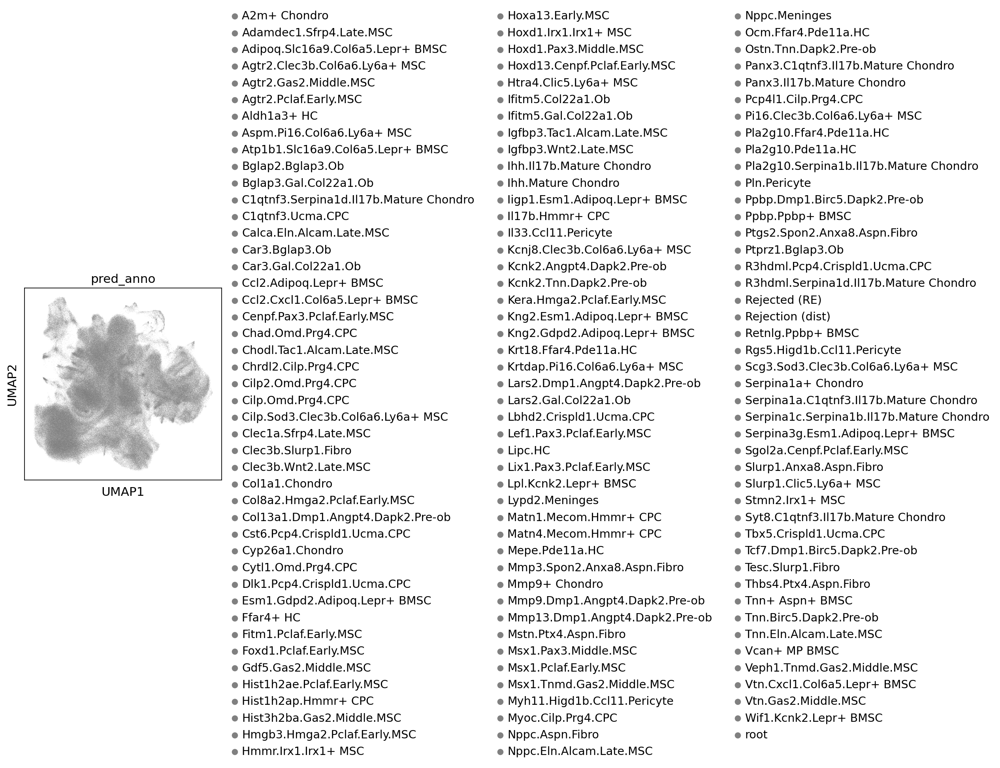

In [280]:
sc.pl.umap(query_latent,color="pred_anno")

In [281]:
idx_rej = ((query_latent.obs['pred_anno'] == 'Rejection (dist)') | (query_latent.obs['pred_anno'] == 'Rejected (RE)'))
query_latent.obs['pred_anno'] = query_latent.obs['pred_anno'].cat.add_categories('Rejected')
query_latent.obs['pred_anno'].values[idx_rej] = 'Rejected'

In [283]:
query_latent.obs['reject'] = '0'
query_latent.obs['reject'].values[idx_rej] = '1'

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


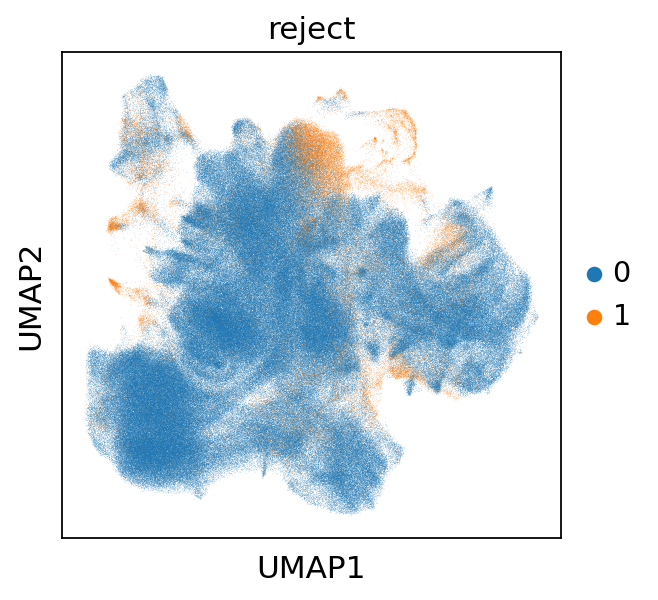

In [287]:
sc.pl.umap(query_latent,color="reject",save="rejection")

In [285]:
query_latent.obs.groupby(["reject"]).count()

,Sample,Project,Core Dataset,Limb Atlas,Cranial Atlas,Organ,Tissue,Tissue(Specific),Stage,Gene type,...,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,new_totals_log,batch,_scvi_batch,scanvi_label,_scvi_labels,leiden,pred_anno
reject,,,,,,,,,,,,,,,,,,,,,
0,718102,718102,718102,718102,718102,718102,718102,718102,718102,718102,...,718102,718102,718102,718102,718102,718102,718102,718102,718102,718102
1,63295,63295,63295,63295,63295,63295,63295,63295,63295,63295,...,63295,63295,63295,63295,63295,63295,63295,63295,63295,63295


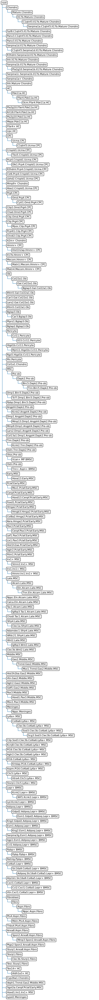

In [289]:
scHPL.utils.print_tree(osteo_tree)

In [290]:
reflatent2

AnnData object with n_obs × n_vars = 272369 × 15
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Sample', 'Project', 'Limb.Atlas', 'Organ', 'Tissue', 'Tissue.Specific.', 'Stage', 'Gene.type', 'Treatment', 'Age', 'Age.In.Detail.', 'Machine', 'Species', 'Isolation.approach', 'Digestion', 'Enzymes', 'Bone.Forming.Methods', 'Data.Source', 'Related.Assay', 'Origin', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'temp_cluster', 'batch', 'batch_atlas', 'size_factors', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'anno_level_1', 'anno_level_2', 'anno_level_3', 'anno_level_4', 'anno_level_5', 'mix_level_1', 'mix_level_2', 'merge_id_level3', 'merge_id_level4', 'merge_id_level5', 'cellid', 'leiden_clusters_level_1', 'leiden_clusters_level_2', 'leide

In [ ]:
osteo_tree2 = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None
parent3 = None
parent4 = None
parent5 = None

for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree2[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                parent3 = newNode
            elif i == 3:
                parent3.add_descendant(newNode)
                parent4 = newNode
            elif i == 4:
                parent4.add_descendant(newNode)
            elif i == 5:
                parent5.add_descendant(newNode)
                
            i+=1


osteo_tree2 = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C90_named.values), 
               osteo_tree2, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)
file_to_store = open("../model/tree_osteo_anno90.pickle", "wb")
pickle.dump(osteo_tree2, file_to_store)
file_to_store.close()
y_pred_query_anno90 = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree2,
               threshold = 0.5)

In [314]:
reflatent2.obs.C137_named.values

['Tnn.Eln.Alcam.Late.MSC', 'Krtdap.Pi16.Col6a6.Ly6a+ MSC', 'Ifitm5.Col22a1.Ob', 'Ifitm5.Col22a1.Ob', 'Atp1b1.Slc16a9.Col6a5.Lepr+ BMSC', ..., 'Vcan+ MP BMSC', 'Tcf7.Dmp1.Birc5.Dapk2.Pre-ob', 'Ocm.Ffar4.Pde11a.HC', 'Ptprz1.Bglap3.Ob', 'Ifitm5.Col22a1.Ob']
Length: 272369
Categories (133, object): ['A2m+ Chondro', 'Adamdec1.Sfrp4.Late.MSC', 'Adipoq.Slc16a9.Col6a5.Lepr+ BMSC', 'Agtr2.Clec3b.Col6a6.Ly6a+ MSC', ..., 'Vtn.Cxcl1.Col6a5.Lepr+ BMSC', 'Vtn.Gas2.Middle.MSC', 'Wfdc21.Sfrp4.Late.MSC', 'Wif1.Kcnk2.Lepr+ BMSC']

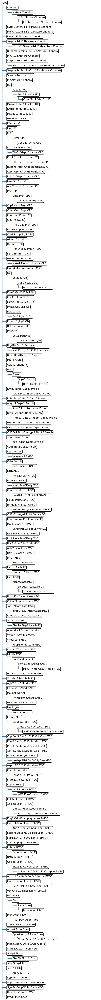

In [305]:
scHPL.utils.print_tree(osteo_tree3)

In [327]:
print(parent1)
print(parent2)
print(parent3)
print(ind_sub)
print(k)
print(ind[0])

Node("['Lypd2.Meninges']")
Node("['Aldh1a3+ HC']")
Node("['Mmp3.Spon2.Anxa8.Aspn.Fibro']")
Lypd2.Meninges
5
MSC


[########################################] | 100% Completed | 103.01 ms


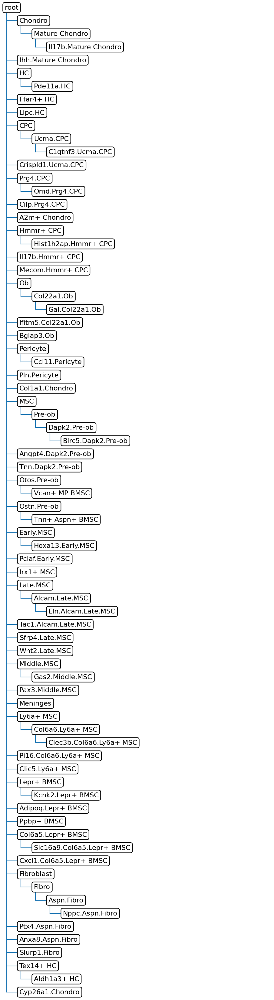

In [329]:
osteo_tree3 = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None
parent3 = None
parent4 = None

with ProgressBar():
    xx = df.groupby(['C7_named', 'C19_named', 'C36_named', 'C49_named'],observed=True).size().compute()
xx = xx.iloc[xx.values>0]
xx.index[0]
for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree3[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                parent3 = newNode
            elif i == 3:
                parent3.add_descendant(newNode)
                parent = newNode
            elif i == 4:
                parent.add_descendant(newNode)
                
            i+=1
scHPL.utils.print_tree(osteo_tree3)

In [ ]:


osteo_tree3 = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C49_named.values), 
               osteo_tree3, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)
file_to_store = open("../model/tree_osteo_anno49.pickle", "wb")
pickle.dump(osteo_tree3, file_to_store)
file_to_store.close()
y_pred_query_anno49 = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree3,
               threshold = 0.5)

In [ ]:
osteo_tree4 = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None
parent3 = None
with ProgressBar():
    xx = df.groupby(['C7_named', 'C19_named', 'C36_named'],observed=True).size().compute()
xx = xx.iloc[xx.values>0]
xx.index[0]
for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree4[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                parent3 = newNode
            elif i == 3:
                parent3.add_descendant(newNode)

            i+=1


osteo_tree4 = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C36_named.values), 
               osteo_tree4, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)
file_to_store = open("../model/tree_osteo_anno36.pickle", "wb")
pickle.dump(osteo_tree4, file_to_store)
file_to_store.close()
y_pred_query_anno36 = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree4,
               threshold = 0.5)

In [ ]:
osteo_tree5 = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None

with ProgressBar():
    xx = df.groupby(['C7_named', 'C19_named'],observed=True).size().compute()
xx = xx.iloc[xx.values>0]
xx.index[0]
for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree5[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                
            i+=1


osteo_tree5 = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C19_named.values), 
               osteo_tree5, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)
file_to_store = open("../model/tree_osteo_anno19.pickle", "wb")
pickle.dump(osteo_tree5, file_to_store)
file_to_store.close()
y_pred_query_anno19 = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree5,
               threshold = 0.5)

In [ ]:
osteo_tree6 = scHPL.utils.create_tree('root')

node_added = []
parent1 = None
parent2 = None

with ProgressBar():
    xx = df.groupby(['C2_named', 'C7_named'],observed=True).size().compute()
xx = xx.iloc[xx.values>0]
xx.index[0]
for ind in xx.index:
    
    for k, ind_sub in enumerate(ind):
        
        if ind_sub == 'None':
            continue
        
        if k==0:
            i=0
            
        if not np.isin(ind_sub, node_added):
            node_added.append(ind_sub)
            
            newNode = scHPL.utils.TreeNode([ind_sub])
            
            if i == 0:
                osteo_tree6[0].add_descendant(newNode)
                parent1 = newNode
            elif i == 1:
                parent1.add_descendant(newNode)
                parent2 = newNode
            elif i == 2:
                parent2.add_descendant(newNode)
                
                
            i+=1


osteo_tree6 = scHPL.train.train_tree(reflatent2.X, 
               np.array(reflatent2.obs.C7_named.values), 
               osteo_tree6, 
               classifier = 'knn', 
               dimred = False, 
               useRE = True, 
               FN = 0.5, 
               n_neighbors = 50, dynamic_neighbors = True)
file_to_store = open("../model/tree_osteo_anno7.pickle", "wb")
pickle.dump(osteo_tree6, file_to_store)
file_to_store.close()
y_pred_query_anno7 = scHPL.predict.predict_labels(query_latent.X,
               tree = osteo_tree6,
               threshold = 0.5)

In [335]:
query_latent.obs["pred_anno7"]=y_pred_query_anno7

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


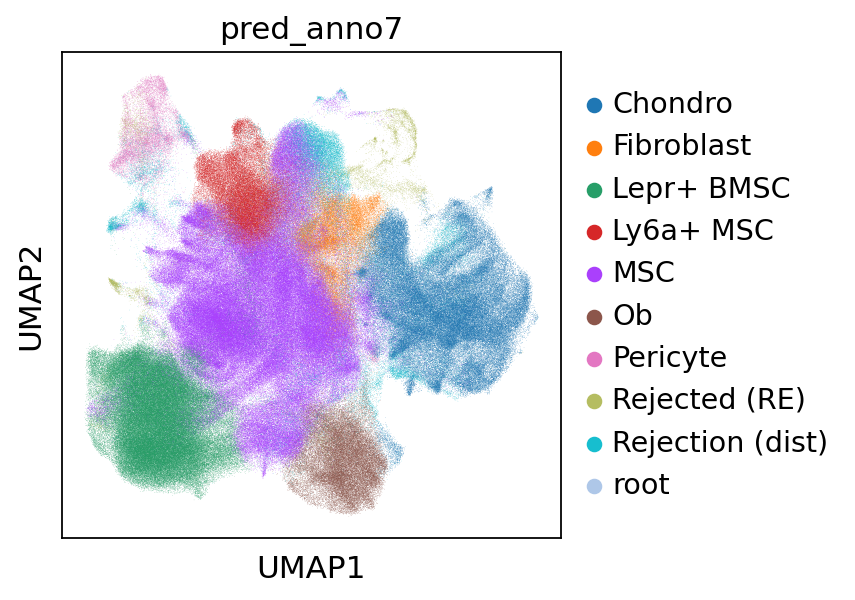

In [338]:
sc.pl.umap(query_latent,color="pred_anno7")

In [339]:
query_latent.obs["pred_anno19"]=y_pred_query_anno19

/home/gilberthan/.local/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


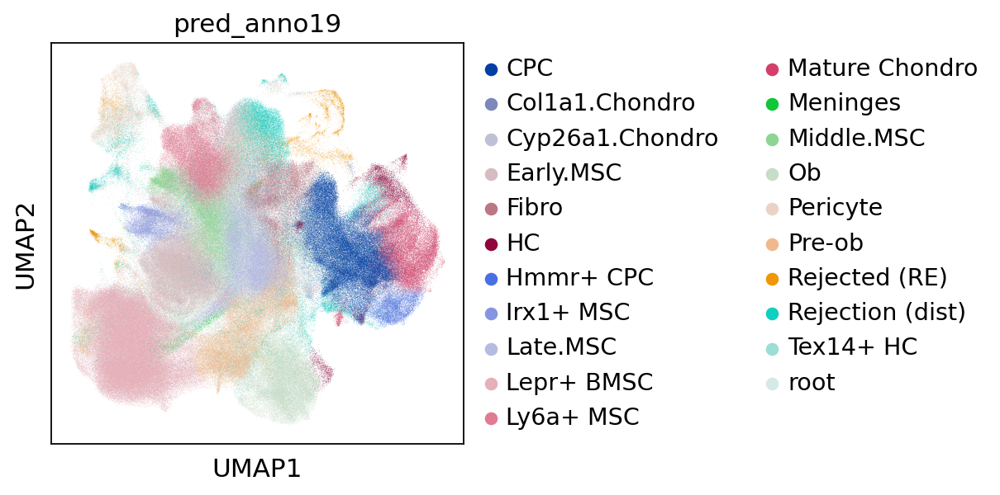

In [340]:
sc.pl.umap(query_latent,color="pred_anno19")

In [341]:
query_latent.obs["pred_anno36"]=y_pred_query_anno36
query_latent.obs["pred_anno49"]=y_pred_query_anno49
query_latent.obs["pred_anno90"]=y_pred_query_anno90

In [342]:
query_latent.write_h5ad("../../important_processed_data/8.29_reflatent.h5ad")

In [345]:
json_file = open("anntation/config/parameters_wtintegrate.json")
# read json into dictionary
json_str = json_file.read()
parameter_dict = json.loads(json_str)

In [346]:
batch=parameter_dict["batch_var"]

global_seed = parameter_dict["global_seed"]
target_clusterN = parameter_dict["target_clusterN"]

start_res = parameter_dict["start_res"]
end_res = parameter_dict["end_res"]
step_size = parameter_dict["step_size"]
include_low_res = parameter_dict["include_low_res"]
n_neighbors = parameter_dict["k_param"]

min_cells_valid = parameter_dict["min_cells_valid"]
additional_clustering_suffix = parameter_dict["additional_clustering_suffix"]


In [347]:
batch

'batch'

In [350]:
#define resolution range, hardcoded atm
resolutions = [round(x*step_size,3) for x in range(int(1/step_size)*start_res,int(1/step_size)*end_res+1)]
if(include_low_res):
  low_res_list = [0.001,0.005,0.01,0.05,0.1,0.175,0.25,0.5,0.75]
  #low_res_list = [0.001,0.005,0.0075,0.01,0.05,0.1,0.175,0.25,0.5,0.75,3,5,6,7,15,16,28,37,38,45,50]
  resolutions = low_res_list + resolutions

In [ ]:

for res in resolutions:
        key_name = "leiden_clusters_"+str(res)
        sc.tl.leiden(query_latent,resolution=res,key_added=key_name,random_state=global_seed,neighbors_key='neighbors') # could use neighbors_key
        value_counts = query_latent.obs[key_name].value_counts()
        print(" Ran leiden with resolution "+str(res)+" and found "+str(len(set(query_latent.obs[key_name])))+" total clusters with "+str(len(value_counts[value_counts > min_cells_valid]))+" valid clusters")
        if(len(value_counts[value_counts > min_cells_valid]) >= target_clusterN):
            print(" Reached "+str(len(value_counts[value_counts > min_cells_valid]))+" valid clusters")
            break    
high_res=[round(x*step_size,3) for x in range(int(1/step_size)*start_res,int(1/step_size)*end_res+1)]
for res in high_res:
        key_name = "leiden_clusters_"+str(res)
        sc.tl.leiden(query_latent,resolution=res,key_added=key_name,random_state=global_seed,neighbors_key='neighbors') # could use neighbors_key
        value_counts = query_latent.obs[key_name].value_counts()
        print(" Ran leiden with resolution "+str(res)+" and found "+str(len(set(query_latent.obs[key_name])))+" total clusters with "+str(len(value_counts[value_counts > min_cells_valid]))+" valid clusters")
        if(len(value_counts[value_counts > min_cells_valid]) >= 300):
            print(" Reached "+str(len(value_counts[value_counts > min_cells_valid]))+" valid clusters")
            break 

 Ran leiden with resolution 0.001 and found 1 total clusters with 1 valid clusters
 Ran leiden with resolution 0.005 and found 1 total clusters with 1 valid clusters
 Ran leiden with resolution 0.01 and found 1 total clusters with 1 valid clusters
 Ran leiden with resolution 0.05 and found 5 total clusters with 5 valid clusters


In [353]:
query_latent.write_h5ad("../../important_processed_data/8.29_reflatent.h5ad")

In [354]:
query_latent

AnnData object with n_obs × n_vars = 781397 × 15
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', '_scvi_batch', 'scanvi_label', '_scvi_labels', 'leiden', 'pred_anno', 'reject', 'pred_anno7', 'pred_anno19', 'pred_anno36', 'pred_anno49', 'pred_anno90', 'leiden_clusters_0.001', 'leiden_clusters_0.005', 'leide